# Description

Additional figures while preparing cogsci presentation.

# undo given error/no error

In [1]:
import pandas as pd
import numpy as np
import math

import matplotlib.pyplot as plt
import seaborn as sns

import json
from anytree.importer import JsonImporter
from anytree import PreOrderIter

In [2]:
from scipy import stats
from scipy.stats import sem
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import ttest_rel,ttest_ind

In [3]:
%load_ext rpy2.ipython

from rpy2.robjects.packages import importr
# import R's "base" package
lme4 = importr('lme4')
optimx = importr('optimx')
pbkrtest = importr('pbkrtest')
lmerTest = importr('lmerTest')
ggplot = importr('ggplot2')
dplyr = importr('dplyr')
sjplot = importr('sjPlot')
car = importr('car')
# fitdistrplus = importr('fitdistrplus')
boot = importr('boot')

In [4]:
home_dir = '/Users/dbao/google_drive_db'+'/road_construction/data/2022_online/'
# home_dir = 'G:\My Drive\\researches\\nyu\\road-construction-local-dk\data_online_2022\\'
map_dir = 'active_map/'
data_dir  = 'data/preprocessed'
out_dir = home_dir + 'figures/figures_all/'
R_out_dir = home_dir + 'R_analysis_data/'

In [5]:
data_puzzle_level = pd.read_csv(R_out_dir +  'data.csv')
puzzleID_order_data = data_puzzle_level.sort_values(["subjects","puzzleID","condition"])
data_choice_level = pd.read_csv(R_out_dir +  'choice_level/choicelevel_data.csv')

single_condition_data = puzzleID_order_data[puzzleID_order_data['condition']==1].copy()
single_condition_data = single_condition_data.reset_index()
sc_data_choice_level = data_choice_level[data_choice_level['condition']==1].reset_index()

with open(home_dir +'tree_data/undo_tree', 'r') as file:
    undo_tree = json.load(file)

## proportion of undo (starting/ non starting) for given error / no error

### including single undo

In [6]:
mas_map = [sc_data_choice_level.allMAS[sc_data_choice_level["puzzleID"]==i].tolist()[0] for i in np.unique(sc_data_choice_level['puzzleID'])]

no_error_mat = []
error_mat = []

no_error_ct_sbj = []
error_ct_sbj = []

for sub in range(100):
    dat_sbj  = sc_data_choice_level[sc_data_choice_level['subjects']==sub].sort_values(["puzzleID","index"])
        
    error_ct_pz = [] # to start 1 # to non-start 2
    no_error_ct_pz = [] # to start 1 # to non-start 2
    for pzi in np.unique(sc_data_choice_level['puzzleID']):
        dat_sbj_pzi = dat_sbj[dat_sbj['puzzleID'] == pzi].reset_index()
        index=0
        while index < len(dat_sbj_pzi):
            print('*'*40)
            print( len(dat_sbj_pzi))
            print(index)
            
#         for index in range(len(dat_sbj_pzi)):
            # for non-single undo only (doesnt chjange the result)
#             if (dat_sbj_pzi.firstUndo[index] == 1) and (dat_sbj_pzi.lastUndo[index] == 1):
#                 index += 1
#                 continue
            if dat_sbj_pzi.firstUndo[index] == 1:
                index_temp = index
                while dat_sbj_pzi.lastUndo[index] != 1:
                    index +=1
                pend = np.double((dat_sbj_pzi.currNumCities[index]-1)/(mas_map[pzi]-1)!=0)
                # if no error
                if dat_sbj_pzi.severityOfErrors[index_temp-1]==0:
                    no_error_ct_pz.append(pend+1)# to start 1 # to non-start 2
                else:
                    error_ct_pz.append(pend+1)# to start 1 # to non-start 2
            index += 1
                
    no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
    error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
        
    no_error_mat.extend(no_error_ct_pz)
    error_mat.extend(error_ct_pz)


****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
30
0
****************************************
30
1
****************************************
30
2
****************************************
30
3
**************************

****************************************
20
6
****************************************
20
11
****************************************
20
12
****************************************
20
13
****************************************
20
14
****************************************
20
15
****************************************
20
16
****************************************
20
17
****************************************
20
18
****************************************
20
19
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
37
0
*************************

40
****************************************
44
41
****************************************
44
42
****************************************
44
43
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
37
0
****************************************
37
1
****************************************
37
2
****************************************
37
3
****************************************
37
4
****************************************
37
5
****************************************
37
6
****************************************
37
7
****************************

29
****************************************
54
30
****************************************
54
31
****************************************
54
32
****************************************
54
33
****************************************
54
37
****************************************
54
38
****************************************
54
39
****************************************
54
40
****************************************
54
41
****************************************
54
44
****************************************
54
45
****************************************
54
46
****************************************
54
47
****************************************
54
48
****************************************
54
49
****************************************
54
51
****************************************
54
52
****************************************
54
53
****************************************
29
0
****************************************
29
1
****************************************
29
2
*************

24
11
****************************************
24
12
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
52
0
****************************************
52
1
****************************************
52
2
****************************************
52
3
****************************************
52
4
****************************************
52
5
****************************************
52
6
****************************************
52
7
****************************************
52
8
****************************************
52
9
****************************************
52
17
****************************************
52
18
****************************************
52
19
*****************

50
31
****************************************
50
32
****************************************
50
33
****************************************
50
34
****************************************
50
41
****************************************
50
42
****************************************
50
43
****************************************
50
44
****************************************
50
45
****************************************
50
46
****************************************
50
47
****************************************
50
48
****************************************
50
49
****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************

****************************************
78
42
****************************************
78
47
****************************************
78
48
****************************************
78
49
****************************************
78
50
****************************************
78
51
****************************************
78
52
****************************************
78
53
****************************************
78
54
****************************************
78
55
****************************************
78
56
****************************************
78
61
****************************************
78
62
****************************************
78
63
****************************************
78
64
****************************************
78
65
****************************************
78
66
****************************************
78
71
****************************************
78
72
****************************************
78
73
****************************************
78
74
*************

****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
23
0
****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************
23
4
****************************************
23
5
****************************************
23
6
****************************************
23
7
********************************

16
****************************************
42
0
****************************************
42
1
****************************************
42
2
****************************************
42
3
****************************************
42
4
****************************************
42
5
****************************************
42
6
****************************************
42
11
****************************************
42
12
****************************************
42
13
****************************************
42
14
****************************************
42
15
****************************************
42
16
****************************************
42
17
****************************************
42
23
****************************************
42
24
****************************************
42
25
****************************************
42
26
****************************************
42
27
****************************************
42
28
****************************************
42
30
*****************

8
****************************************
16
9
****************************************
16
10
****************************************
16
11
****************************************
16
13
****************************************
16
14
****************************************
16
15
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
***********************************

1
****************************************
16
2
****************************************
16
3
****************************************
16
4
****************************************
16
5
****************************************
16
6
****************************************
16
7
****************************************
16
8
****************************************
16
11
****************************************
16
12
****************************************
16
13
****************************************
16
14
****************************************
16
15
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
***************************

9
****************************************
38
0
****************************************
38
1
****************************************
38
2
****************************************
38
3
****************************************
38
4
****************************************
38
5
****************************************
38
6
****************************************
38
7
****************************************
38
13
****************************************
38
14
****************************************
38
15
****************************************
38
16
****************************************
38
17
****************************************
38
18
****************************************
38
23
****************************************
38
24
****************************************
38
25
****************************************
38
26
****************************************
38
27
****************************************
38
31
****************************************
38
32
*******************

11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
***************************

50
30
****************************************
50
31
****************************************
50
32
****************************************
50
33
****************************************
50
34
****************************************
50
41
****************************************
50
42
****************************************
50
43
****************************************
50
44
****************************************
50
45
****************************************
50
46
****************************************
50
47
****************************************
50
48
****************************************
50
49
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
***************

27
17
****************************************
27
18
****************************************
27
19
****************************************
27
20
****************************************
27
21
****************************************
27
22
****************************************
27
23
****************************************
27
24
****************************************
27
25
****************************************
27
26
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
14
0
****************************************
14
1
*******************

11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
*************************************

****************************************
15
14
****************************************
26
0
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
7
****************************************
26
8
****************************************
26
9
****************************************
26
17
****************************************
26
18
****************************************
26
19
****************************************
26
20
****************************************
26
21
****************************************
26
22
****************************************
26
23
****************************************
26
24
****************************************
26
25
****************************************
11
0
************************

****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9


/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
13
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
********************

****************************************
39
5
****************************************
39
6
****************************************
39
7
****************************************
39
8
****************************************
39
9
****************************************
39
17
****************************************
39
18
****************************************
39
19
****************************************
39
20
****************************************
39
21
****************************************
39
22
****************************************
39
23
****************************************
39
24
****************************************
39
25
****************************************
39
31
****************************************
39
32
****************************************
39
33
****************************************
39
34
****************************************
39
35
****************************************
39
36
****************************************
39
37
******************

****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
17
0
****************************************
17
1
****************************************
17
2
****************************************
17
3
****************************************
17
4
****************************************
17
5
****************************************
17
6
****************************************
17
7
****************************************
17
8
****************************************
17
9
****************************************
17
12
****************************************
17
13
****************************************
17
14
****************************************
17
15
****************************************
17
16
****************************************
11
0
***************************

10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
47
0
****************************************
47
1
****************************************
47
2
****************************************
47
3
****************************************
47
4
****************************************
47
5
****************************************
47
6
****************************************
47
7
****************************************
47
8
****************************************
47
15
****************************************
47
16
****************************************
47
17
****************************************
47
18
****************************************
47
19
****************************************
47
20
***********************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11

11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
21
0
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
8
****************************************
21
12
***************************

11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
16
0
****************************************
16
1
****************************************
16
2
****************************************
16
3
****************************************
16
4
****************************************
16
5
****************************************
16
6
****************************************
16
7
****************************************
16
10
****************************************
16
11
****************************************
16
12
****************************************
16
13
****************************************
16
14
****************************************
16
15
****************************************
19
0
****************************************
19
1
****************************************
19
2
**********************

****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
***************************************

****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])



22
20
****************************************
22
21
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
************************

****************************************
18
16
****************************************
18
17
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************


15
****************************************
14
0
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
7
****************************************
14
10
****************************************
14
11
****************************************
14
12
****************************************
14
13
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
***************************

5
****************************************
25
6
****************************************
25
7
****************************************
25
8
****************************************
25
9
****************************************
25
10
****************************************
25
11
****************************************
25
15
****************************************
25
16
****************************************
25
17
****************************************
25
18
****************************************
25
19
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
24
0
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
*********************

26
6
****************************************
26
7
****************************************
26
13
****************************************
26
14
****************************************
26
15
****************************************
26
16
****************************************
26
17
****************************************
26
18
****************************************
26
19
****************************************
26
20
****************************************
26
22
****************************************
26
23
****************************************
26
24
****************************************
26
25
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
*****************

11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])



7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
6
0
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
5
0
****************************************
5
1
****************************************
5
2
****************************************
5
3
****************************************
5
4
*

10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
*****************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
15
0
****************************************
15
1
****************************************
15
2
****************************************
15
3
****************************************
15
4
****************************************
15
5
****************************************
15
6
****************************************
15
7
****************************************
15
8
****************************************
15
9
****************************************
15
10
****************************************
15
11
****************************************
15
12
*****************************

****************************************
36
23
****************************************
36
24
****************************************
36
25
****************************************
36
30
****************************************
36
31
****************************************
36
32
****************************************
36
33
****************************************
36
34
****************************************
36
35
****************************************
16
0
****************************************
16
1
****************************************
16
2
****************************************
16
3
****************************************
16
4
****************************************
16
5
****************************************
16
6
****************************************
16
7
****************************************
16
8
****************************************
16
9
****************************************
16
12
****************************************
16
13
***********************

****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************

****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
**********

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])


****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
14
0
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
***

12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
*******************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************

****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
*********************************

8
****************************************
11
9
****************************************
11
10
****************************************
21
0
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
13
****************************************
21
14
****************************************
21
15
****************************************
21
16
****************************************
21
17
****************************************
21
18
****************************************
21
19
****************************************
21
20
****************************************
10
0
****************************************
10
1
****************************************
10
2
***********************

12
****************************************
15
13
****************************************
15
14
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
************************************

23
19
****************************************
23
20
****************************************
23
21
****************************************
23
22
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
34
0
****************************************
34
1
****************************************
34
2
****************************************
34
3
****************************************
34
4
****************************************
34
5
****************************************
34
6
****************************************
34
7
*************************

45
40
****************************************
45
41
****************************************
45
42
****************************************
45
43
****************************************
45
44
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
***********************

****************************************
41
4
****************************************
41
5
****************************************
41
6
****************************************
41
7
****************************************
41
8
****************************************
41
9
****************************************
41
15
****************************************
41
16
****************************************
41
17
****************************************
41
18
****************************************
41
19
****************************************
41
20
****************************************
41
21
****************************************
41
29
****************************************
41
30
****************************************
41
31
****************************************
41
32
****************************************
41
33
****************************************
41
34
****************************************
41
35
****************************************
41
36
*******************

****************************************
51
32
****************************************
51
33
****************************************
51
34
****************************************
51
35
****************************************
51
42
****************************************
51
43
****************************************
51
44
****************************************
51
45
****************************************
51
46
****************************************
51
47
****************************************
51
48
****************************************
51
49
****************************************
51
50
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
11
********************

9
****************************************
11
10
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
******************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
14
0
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
7
****************************************
14
8
****************************************
14
9
****************************************
14
10
****************************************
14
11
****************************************
14
12
****************************************
14
13
************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
36
0
****************************************
36
1
****************************************
36
2
****************************************
36
3
****************************************
36
4
****************************************
36
5
****************************************
36
6
****************************************
36
7
****************************************
36
13
****************************************
36
14
****************************************
36
15
*******************************

0
****************************************
35
1
****************************************
35
2
****************************************
35
3
****************************************
35
4
****************************************
35
5
****************************************
35
6
****************************************
35
7
****************************************
35
8
****************************************
35
15
****************************************
35
16
****************************************
35
17
****************************************
35
18
****************************************
35
19
****************************************
35
20
****************************************
35
21
****************************************
35
22
****************************************
35
28
****************************************
35
29
****************************************
35
30
****************************************
35
31
****************************************
35
32
*******************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
30
0
****************************************
30
1
****************************************
30
2
****************************************
30
3
****************************************
30
4
****************************************
30
5
****************************************
30
6
****************************************
30
7
****************************************
30
13
****************************************
30
14
****************************************
30
15
*******************************

24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
13
****************************************
24
14
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
*******************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])


****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
20
0
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
7
****************************************
20
13
****************************************
20
14
****************************************
20
15
*******************************

5
****************************************
27
6
****************************************
27
7
****************************************
27
8
****************************************
27
9
****************************************
27
12
****************************************
27
13
****************************************
27
14
****************************************
27
15
****************************************
27
20
****************************************
27
21
****************************************
27
22
****************************************
27
23
****************************************
27
24
****************************************
27
25
****************************************
27
26
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
*********************

11
9
****************************************
11
10
****************************************
25
0
****************************************
25
1
****************************************
25
2
****************************************
25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
11
****************************************
25
12
****************************************
25
13
****************************************
25
14
****************************************
25
18
****************************************
25
19
****************************************
25
20
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
11
0
*****************

9
****************************************
14
10
****************************************
14
11
****************************************
14
12
****************************************
14
13
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
************************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
************************************

7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************


****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
*****

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])



9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
9
0
****************************************
9
1
****************************************
9
2
**********************************

****************************************
108
39
****************************************
108
40
****************************************
108
41
****************************************
108
49
****************************************
108
50
****************************************
108
51
****************************************
108
52
****************************************
108
53
****************************************
108
54
****************************************
108
55
****************************************
108
56
****************************************
108
60
****************************************
108
61
****************************************
108
62
****************************************
108
63
****************************************
108
67
****************************************
108
68
****************************************
108
69
****************************************
108
70
****************************************
108
71
****************************************

****************************************
44
0
****************************************
44
1
****************************************
44
2
****************************************
44
3
****************************************
44
4
****************************************
44
5
****************************************
44
6
****************************************
44
7
****************************************
44
8
****************************************
44
9
****************************************
44
16
****************************************
44
17
****************************************
44
18
****************************************
44
19
****************************************
44
20
****************************************
44
21
****************************************
44
26
****************************************
44
27
****************************************
44
28
****************************************
44
30
****************************************
44
31
***********************

9
****************************************
76
17
****************************************
76
18
****************************************
76
19
****************************************
76
20
****************************************
76
21
****************************************
76
22
****************************************
76
23
****************************************
76
24
****************************************
76
25
****************************************
76
26
****************************************
76
27
****************************************
76
35
****************************************
76
36
****************************************
76
37
****************************************
76
38
****************************************
76
39
****************************************
76
40
****************************************
76
41
****************************************
76
42
****************************************
76
43
****************************************
76
44
***********

17
****************************************
35
18
****************************************
35
19
****************************************
35
20
****************************************
35
21
****************************************
35
27
****************************************
35
28
****************************************
35
29
****************************************
35
30
****************************************
35
31
****************************************
35
32
****************************************
35
33
****************************************
35
34
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
*******************

33
5
****************************************
33
6
****************************************
33
7
****************************************
33
8
****************************************
33
9
****************************************
33
10
****************************************
33
16
****************************************
33
17
****************************************
33
18
****************************************
33
19
****************************************
33
20
****************************************
33
21
****************************************
33
26
****************************************
33
27
****************************************
33
28
****************************************
33
29
****************************************
33
30
****************************************
33
31
****************************************
33
32
****************************************
9
0
****************************************
9
1
****************************************
9
2
******************

11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************
11
1
************************************

****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
20
0
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
*******************************

****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
27
0
****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
****************************************
27
8
****************************************
27
15
****************************************
27
16
****************************************
27
17
****************************************
27
18
****************************************
27
19
****************************************
27
20
****************************************
27
21
***************************

1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
6
0
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
**************************************

6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
************************************

****************************************
36
0
****************************************
36
1
****************************************
36
2
****************************************
36
3
****************************************
36
4
****************************************
36
5
****************************************
36
6
****************************************
36
7
****************************************
36
13
****************************************
36
14
****************************************
36
15
****************************************
36
16
****************************************
36
17
****************************************
36
18
****************************************
36
19
****************************************
36
20
****************************************
36
27
****************************************
36
28
****************************************
36
29
****************************************
36
30
****************************************
36
31
*********************

****************************************
60
0
****************************************
60
1
****************************************
60
2
****************************************
60
3
****************************************
60
4
****************************************
60
5
****************************************
60
6
****************************************
60
7
****************************************
60
13
****************************************
60
14
****************************************
60
15
****************************************
60
16
****************************************
60
17
****************************************
60
21
****************************************
60
22
****************************************
60
23
****************************************
60
24
****************************************
60
25
****************************************
60
26
****************************************
60
27
****************************************
60
28
*********************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
27
0
****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
****************************************
27
8
****************************************
27
13
****************************************
27
14
****************************************
27
15
*******************************

****************************************
30
4
****************************************
30
5
****************************************
30
6
****************************************
30
7
****************************************
30
8
****************************************
30
9
****************************************
30
15
****************************************
30
16
****************************************
30
17
****************************************
30
18
****************************************
30
19
****************************************
30
20
****************************************
30
24
****************************************
30
25
****************************************
30
26
****************************************
30
27
****************************************
30
28
****************************************
30
29
****************************************
10
0
****************************************
10
1
****************************************
10
2
**********************

2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
0
****************************************
12
1
******************************

****************************************
51
48
****************************************
51
49
****************************************
51
50
****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
13
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
36
0
**********************

****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
44
0
****************************************
44
1
****************************************
44
2
****************************************
44
3
****************************************
44
4
****************************************
44
5
****************************************
44
6
****************************************
44
7
****************************************
44
8
****************************************
44
9
****************************************
44
13
****************************************
44
14
****************************************
44
15
****************************************
44
16
*****************************

****************************************
5
0
****************************************
5
1
****************************************
5
2
****************************************
5
3
****************************************
5
4
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
*

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.t

****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
***************************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
20
0
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
7
****************************************
20
13
****************************************
20
14
****************************************
20
15
*******************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
14
******************************

****************************************
58
19
****************************************
58
20
****************************************
58
21
****************************************
58
23
****************************************
58
24
****************************************
58
25
****************************************
58
26
****************************************
58
27
****************************************
58
35
****************************************
58
36
****************************************
58
37
****************************************
58
38
****************************************
58
39
****************************************
58
40
****************************************
58
41
****************************************
58
42
****************************************
58
49
****************************************
58
50
****************************************
58
51
****************************************
58
52
****************************************
58
53
*************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
32
0
*********************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


****************************************
36
0
****************************************
36
1
****************************************
36
2
****************************************
36
3
****************************************
36
4
****************************************
36
5
****************************************
36
6
****************************************
36
7
****************************************
36
8
****************************************
36
14
****************************************
36
15
****************************************
36
16
****************************************
36
17
****************************************
36
18
****************************************
36
19
****************************************
36
20
****************************************
36
21
****************************************
36
28
****************************************
36
29
****************************************
36
30
****************************************
36
31
**********************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************


****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
26
0
****************************************
26
1
*********************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



29
28
****************************************
24
0
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
9
****************************************
24
10
****************************************
24
11
****************************************
24
14
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
11
0
*****************

****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
**********************************

7
****************************************
10
8
****************************************
10
9
****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
***********************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])


****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5


17
****************************************
33
23
****************************************
33
24
****************************************
33
25
****************************************
33
26
****************************************
33
27
****************************************
33
28
****************************************
33
29
****************************************
33
30
****************************************
33
31
****************************************
33
32
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
17
0
*********************

3
****************************************
36
4
****************************************
36
5
****************************************
36
6
****************************************
36
7
****************************************
36
13
****************************************
36
14
****************************************
36
15
****************************************
36
16
****************************************
36
17
****************************************
36
18
****************************************
36
19
****************************************
36
25
****************************************
36
26
****************************************
36
27
****************************************
36
29
****************************************
36
30
****************************************
36
31
****************************************
36
32
****************************************
36
33
****************************************
36
34
****************************************
36
35
***************

40
2
****************************************
40
3
****************************************
40
4
****************************************
40
5
****************************************
40
6
****************************************
40
7
****************************************
40
8
****************************************
40
9
****************************************
40
17
****************************************
40
18
****************************************
40
19
****************************************
40
20
****************************************
40
21
****************************************
40
22
****************************************
40
23
****************************************
40
29
****************************************
40
30
****************************************
40
31
****************************************
40
32
****************************************
40
33
****************************************
40
34
****************************************
40
35
***************

9
8
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
**************************************

****************************************
19
4
****************************************
19
5
****************************************
19
6
****************************************
19
11
****************************************
19
12
****************************************
19
13
****************************************
19
14
****************************************
19
15
****************************************
19
16
****************************************
19
17
****************************************
19
18
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
**************************

****************************************
12
10
****************************************
12
11
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************


4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
*******************************

9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
********************************

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])



****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
17
0
****************************************
17
1
****************************************
17
2
****************************************
17
3
****************************************
17
4
****************************************
17
5
****************************************
17
9
****************************************
17
10
****************************************
17
11
****************************************
17
12
****************************************
17
13
****************************************
17
14
****************************************
17
15
****************************************
17
16
****************************************
17
0
****************************************
17
1
****************************************
17
2
**************************

****************************************
40
13
****************************************
40
14
****************************************
40
15
****************************************
40
16
****************************************
40
17
****************************************
40
18
****************************************
40
23
****************************************
40
24
****************************************
40
25
****************************************
40
26
****************************************
40
27
****************************************
40
28
****************************************
40
33
****************************************
40
34
****************************************
40
35
****************************************
40
36
****************************************
40
37
****************************************
40
38
****************************************
40
39
****************************************
8
0
****************************************
8
1
*****************

8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6

5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
*****************************

28
****************************************
49
31
****************************************
49
32
****************************************
49
33
****************************************
49
34
****************************************
49
35
****************************************
49
41
****************************************
49
42
****************************************
49
43
****************************************
49
44
****************************************
49
45
****************************************
49
46
****************************************
49
47
****************************************
49
48
****************************************
32
0
****************************************
32
1
****************************************
32
2
****************************************
32
3
****************************************
32
4
****************************************
32
5
****************************************
32
6
****************************************
32
7
******************

9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
*******************************

****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
****************************************
27
8
****************************************
27
9
****************************************
27
17
****************************************
27
18
****************************************
27
19
****************************************
27
20
****************************************
27
21
****************************************
27
22
****************************************
27
23
****************************************
27
24
****************************************
27
25
****************************************
27
26
****************************************
10
0
****************************************
10
1
************************

****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
**

/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



****************************************
13
8
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
15
0
****************************************
15
1
****************************************
15
2
****************************************
15
3
****************************************
15
4
****************************************
15
5
****************************************
15
6
****************************************
15
7
****************************************
15
8
****************************************
15
11
****************************************
15
12
****************************************
15
13
****************************************
15
14
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
******************************

9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10


/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
64
0
****************************************
64
1
****************************************
64
2
****************************************
64
3
****************************************
64
4
****************************************
64
5
****************************************
64
6
****************************************
64
9
****************************************
64
10
****************************************
64
11
****************************************
64
12
****************************************
64
17
****************************************
64
18
****************************************
64
19
*****************

16
1
****************************************
16
2
****************************************
16
3
****************************************
16
4
****************************************
16
5
****************************************
16
6
****************************************
16
7
****************************************
16
8
****************************************
16
9
****************************************
16
12
****************************************
16
13
****************************************
16
14
****************************************
16
15
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
*************************

****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
**********************************

****************************************
11
10
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************


/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:39: RuntimeWarning: Mean of empty slice.
  no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
/Users/dbao/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/var/folders/1f/jm7zf5792lvd000qt0vb8jmr5t6hzx/T/ipykernel_48292/3030696871.py:40: RuntimeWarning: Mean of empty slice.
  error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])



8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
0
****************************************
9
1
****************************************
9
2
**************************************

****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
***********************************

In [7]:
print((np.array(error_mat)==1).mean())
print((np.array(error_mat)==2).mean())

0.38972809667673713
0.6102719033232629


In [8]:
stats.ttest_ind(np.double(np.array(error_mat)==1), np.double(np.array(error_mat)==2))

Ttest_indResult(statistic=-5.808905245566389, pvalue=9.781040436996746e-09)

In [9]:
print((np.array(no_error_mat)==1).mean())
print((np.array(no_error_mat)==2).mean())

0.4620008587376557
0.5379991412623444


In [10]:
stats.ttest_ind(np.double(np.array(no_error_mat)==1), np.double(np.array(no_error_mat)==2))

Ttest_indResult(statistic=-5.2007752390631445, pvalue=2.069688769286603e-07)

### not including single undo

In [168]:
mas_map = [sc_data_choice_level.allMAS[sc_data_choice_level["puzzleID"]==i].tolist()[0] for i in np.unique(sc_data_choice_level['puzzleID'])]

no_error_mat = []
error_mat = []

no_error_ct_sbj = []
error_ct_sbj = []

for sub in range(100):
    dat_sbj  = sc_data_choice_level[sc_data_choice_level['subjects']==sub].sort_values(["puzzleID","index"])
        
    error_ct_pz = [] # to start 1 # to non-start 2
    no_error_ct_pz = [] # to start 1 # to non-start 2
    for pzi in np.unique(sc_data_choice_level['puzzleID']):
        dat_sbj_pzi = dat_sbj[dat_sbj['puzzleID'] == pzi].reset_index()
        index=0
        while index < len(dat_sbj_pzi):
            print('*'*40)
            print( len(dat_sbj_pzi))
            print(index)
            
#         for index in range(len(dat_sbj_pzi)):
            # for non-single undo only (doesnt chjange the result)
            if (dat_sbj_pzi.firstUndo[index] == 1) and (dat_sbj_pzi.lastUndo[index] == 1):
                index += 1
                continue
            if dat_sbj_pzi.firstUndo[index] == 1:
                index_temp = index
                while dat_sbj_pzi.lastUndo[index] != 1:
                    index +=1
                pend = np.double((dat_sbj_pzi.currNumCities[index]-1)/(mas_map[pzi]-1)!=0)
                # if no error
                if dat_sbj_pzi.severityOfErrors[index_temp-1]==0:
                    no_error_ct_pz.append(pend+1)# to start 1 # to non-start 2
                else:
                    error_ct_pz.append(pend+1)# to start 1 # to non-start 2
            index += 1
                
    no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
    error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
        
    no_error_mat.extend(no_error_ct_pz)
    error_mat.extend(error_ct_pz)


****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
30
0
****************************************
30
1
****************************************
30
2
****************************************
30
3
**************************

10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
*****************************

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
0
****************************************
1

****************************************
37
32
****************************************
37
33
****************************************
37
34
****************************************
37
35
****************************************
37
36
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
25
0
****************************************
25
1
****************************************
25
2
****************************************
25
3
***************************

****************************************
38
0
****************************************
38
1
****************************************
38
2
****************************************
38
3
****************************************
38
4
****************************************
38
5
****************************************
38
6
****************************************
38
7
****************************************
38
8
****************************************
38
9
****************************************
38
10
****************************************
38
11
****************************************
38
14
****************************************
38
15
****************************************
38
16
****************************************
38
17
****************************************
38
20
****************************************
38
21
****************************************
38
22
****************************************
38
29
****************************************
38
30
***********************

39
8
****************************************
39
9
****************************************
39
10
****************************************
39
11
****************************************
39
15
****************************************
39
16
****************************************
39
17
****************************************
39
18
****************************************
39
19
****************************************
39
25
****************************************
39
26
****************************************
39
27
****************************************
39
28
****************************************
39
29
****************************************
39
30
****************************************
39
31
****************************************
39
32
****************************************
39
35
****************************************
39
36
****************************************
39
37
****************************************
39
38
****************************************
34
0
**********

11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
17
0
****************************************
17
1
****************************************
17
2
****************************************
17
3
****************************************
17
4
****************************************
17
5
****************************************
17
6
****************************************
17
7
****************************************
17
8
****************************************
17
9
****************************************
17
10
****************************************
17
13
****************************************
17
14
****************************************
17
15
************************

96
94
****************************************
96
95
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
0
************************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
*********************************

****************************************
21
0
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
13
****************************************
21
14
****************************************
21
15
****************************************
21
16
****************************************
21
17
****************************************
21
18
****************************************
21
19
****************************************
21
20
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
**************************

****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
*******************************

3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
***********************************

****************************************
38
21
****************************************
38
22
****************************************
38
23
****************************************
38
29
****************************************
38
30
****************************************
38
31
****************************************
38
32
****************************************
38
33
****************************************
38
34
****************************************
38
35
****************************************
38
36
****************************************
38
37
****************************************
19
0
****************************************
19
1
****************************************
19
2
****************************************
19
3
****************************************
19
4
****************************************
19
5
****************************************
19
6
****************************************
19
7
****************************************
19
8
**********************

7
****************************************
36
8
****************************************
36
15
****************************************
36
16
****************************************
36
17
****************************************
36
18
****************************************
36
19
****************************************
36
20
****************************************
36
21
****************************************
36
27
****************************************
36
28
****************************************
36
29
****************************************
36
30
****************************************
36
31
****************************************
36
32
****************************************
36
33
****************************************
36
34
****************************************
36
35
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************

C:\ProgramData\Anaconda3\envs\base37\lib\site-packages\ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice.


****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
14
0
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
7
****************************************
14
8
****************************************
14
9
****************************************
14
10
****************************************
14
11
****************************************
14
12
*******************************

****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
********************************

4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
0
****************************************
11
1
****************************************
11
2
*****************************

25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
8
****************************************
25
15
****************************************
25
16
****************************************
25
17
****************************************
25
18
****************************************
25
19
****************************************
25
20
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
*******************

C:\ProgramData\Anaconda3\envs\base37\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: Mean of empty slice.


****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
21
0
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
13
****************************************
21
14
****************************************
21
15
****************************************
21
16
****************************************
21
17
*************************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
6
0
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************

10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
0


****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
1

****************************************
23
0
****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************
23
4
****************************************
23
5
****************************************
23
6
****************************************
23
7
****************************************
23
8
****************************************
23
15
****************************************
23
16
****************************************
23
17
****************************************
23
18
****************************************
23
19
****************************************
23
20
****************************************
23
21
****************************************
23
22
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
******************************

****************************************
24
0
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
9
****************************************
24
14
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
42
0
************************

****************************************
15
0
****************************************
15
1
****************************************
15
2
****************************************
15
3
****************************************
15
4
****************************************
15
5
****************************************
15
6
****************************************
15
7
****************************************
15
10
****************************************
15
11
****************************************
15
12
****************************************
15
13
****************************************
15
14
****************************************
27
0
****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
*****************************

****************************************
22
20
****************************************
22
21
****************************************
26
0
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
11
****************************************
26
12
****************************************
26
13
****************************************
26
14
****************************************
26
15
****************************************
26
19
****************************************
26
20
****************************************
26
21
****************************************
26
22
****************************************
26
23
****************************************
26
24
****************************************
26
25
********************

16
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
******************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
*********************************

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
*********************************

****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
*********************************

****************************************
37
0
****************************************
37
1
****************************************
37
2
****************************************
37
3
****************************************
37
4
****************************************
37
5
****************************************
37
6
****************************************
37
7
****************************************
37
8
****************************************
37
9
****************************************
37
10
****************************************
37
17
****************************************
37
18
****************************************
37
19
****************************************
37
20
****************************************
37
21
****************************************
37
22
****************************************
37
23
****************************************
37
29
****************************************
37
30
****************************************
37
31
***********************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
24
0
****************************************
24
1
****************************************


11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
9
0
**********************

8
6
****************************************
8
7
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
******

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
26
0
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
7
****************************************
26
12
****************************************
26
13
****************************************
26
14
*******************************

****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************


22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
******************************

****************************************
35
15
****************************************
35
16
****************************************
35
17
****************************************
35
18
****************************************
35
19
****************************************
35
20
****************************************
35
21
****************************************
35
27
****************************************
35
28
****************************************
35
29
****************************************
35
30
****************************************
35
31
****************************************
35
32
****************************************
35
33
****************************************
35
34
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
*******************

32
26
****************************************
32
27
****************************************
32
28
****************************************
32
29
****************************************
32
30
****************************************
32
31
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
7
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
26
0
****************

2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
*******************************

****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
7
0
****************************************


****************************************
36
28
****************************************
36
31
****************************************
36
32
****************************************
36
33
****************************************
36
34
****************************************
36
35
****************************************
27
0
****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
****************************************
27
8
****************************************
27
9
****************************************
27
10
****************************************
27
17
****************************************
27
18
****************************************
27
19
****************************************
27
20
***********************

****************************************
86
27
****************************************
86
28
****************************************
86
35
****************************************
86
36
****************************************
86
37
****************************************
86
38
****************************************
86
39
****************************************
86
40
****************************************
86
41
****************************************
86
42
****************************************
86
46
****************************************
86
47
****************************************
86
48
****************************************
86
49
****************************************
86
50
****************************************
86
57
****************************************
86
58
****************************************
86
59
****************************************
86
60
****************************************
86
61
****************************************
86
62
*************

****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
6
0
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4


****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
*****

****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************


****************************************
51
43
****************************************
51
44
****************************************
51
45
****************************************
51
46
****************************************
51
47
****************************************
51
48
****************************************
51
49
****************************************
51
50
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
***********************************

9
6
****************************************
9
7
****************************************
9
8
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
0
**************************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
21
0
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
8
****************************************
21
9
****************************************
21
10
*********************************

****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
***************************

****************************************
19
14
****************************************
19
15
****************************************
19
16
****************************************
19
17
****************************************
19
18
****************************************
38
0
****************************************
38
1
****************************************
38
2
****************************************
38
3
****************************************
38
4
****************************************
38
5
****************************************
38
6
****************************************
38
7
****************************************
38
8
****************************************
38
15
****************************************
38
16
****************************************
38
17
****************************************
38
18
****************************************
38
19
****************************************
38
20
****************************************
38
21
**********************

****************************************
14
0
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
7
****************************************
14
8
****************************************
14
9
****************************************
14
10
****************************************
14
11
****************************************
14
12
****************************************
14
13
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
******************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
*********************************

11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
30
0
****************************

9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12


0
****************************************
19
1
****************************************
19
2
****************************************
19
3
****************************************
19
4
****************************************
19
5
****************************************
19
6
****************************************
19
7
****************************************
19
8
****************************************
19
13
****************************************
19
14
****************************************
19
15
****************************************
19
16
****************************************
19
17
****************************************
19
18
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
**************************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
11
****************************************
18
12
****************************************
18
13
*****************************

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****

****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
0
****************************************
11
1
****************************************


****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
25
0
****************************************
25
1
****************************************
25
2
****************************************
25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
10
****************************************
25
11
****************************************
25
12
*******************************

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10

1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
7
****************************************
20
8
****************************************
20
13
****************************************
20
14
****************************************
20
15
****************************************
20
16
****************************************
20
17
****************************************
20
18
****************************************
20
19
****************************************
20
0
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
*************************

****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
*******************************

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
*********************************

****************************************
26
0
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
7
****************************************
26
8
****************************************
26
9
****************************************
26
17
****************************************
26
18
****************************************
26
19
****************************************
26
20
****************************************
26
21
****************************************
26
22
****************************************
26
23
****************************************
26
24
****************************************
26
25
****************************************
32
0
****************************************
32
1
*************************

****************************************
28
26
****************************************
28
27
****************************************
24
0
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
9
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
***********************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
**********************************

****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
0
****************************************
11
1
****************************************
11
2
******************************

****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
14
0
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
********************************

****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
23
0
****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************


****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
**********

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
0
****************************************
12
1
****************************************
12

****************************************
19
0
****************************************
19
1
****************************************
19
2
****************************************
19
3
****************************************
19
4
****************************************
19
5
****************************************
19
6
****************************************
19
7
****************************************
19
13
****************************************
19
14
****************************************
19
15
****************************************
19
16
****************************************
19
17
****************************************
19
18
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************

****************************************
126
0
****************************************
126
1
****************************************
126
2
****************************************
126
3
****************************************
126
4
****************************************
126
5
****************************************
126
6
****************************************
126
7
****************************************
126
8
****************************************
126
15
****************************************
126
16
****************************************
126
17
****************************************
126
18
****************************************
126
19
****************************************
126
20
****************************************
126
21
****************************************
126
25
****************************************
126
26
****************************************
126
27
****************************************
126
28
****************************************
126
29
*

****************************************
46
35
****************************************
46
36
****************************************
46
37
****************************************
46
38
****************************************
46
39
****************************************
46
40
****************************************
46
41
****************************************
46
42
****************************************
46
43
****************************************
46
44
****************************************
46
45
****************************************
19
0
****************************************
19
1
****************************************
19
2
****************************************
19
3
****************************************
19
4
****************************************
19
5
****************************************
19
6
****************************************
19
7
****************************************
19
8
****************************************
19
9
***********************

60
58
****************************************
60
59
****************************************
60
0
****************************************
60
1
****************************************
60
2
****************************************
60
3
****************************************
60
4
****************************************
60
5
****************************************
60
6
****************************************
60
7
****************************************
60
13
****************************************
60
14
****************************************
60
15
****************************************
60
16
****************************************
60
17
****************************************
60
21
****************************************
60
22
****************************************
60
23
****************************************
60
24
****************************************
60
25
****************************************
60
26
****************************************
60
27
***************

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
11
****************************************
18
12
****************************************
18
13
******************************

24
6
****************************************
24
7
****************************************
24
8
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
32
0
****************************************
32
1
****************************************
32
2
****************************************
32
3
****************************************
32
4
****************************************
32
5
****************************************
32
6
****************************************
32
7
****************************************
32
13
****************************************
32
14
******************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
20
0
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
11
****************************************
20
12
****************************************
20
13
****************************************
20
14
******************************

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
13
0
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************


****************************************
51
0
****************************************
51
1
****************************************
51
2
****************************************
51
3
****************************************
51
4
****************************************
51
5
****************************************
51
6
****************************************
51
11
****************************************
51
12
****************************************
51
13
****************************************
51
14
****************************************
51
15
****************************************
51
16
****************************************
51
17
****************************************
51
18
****************************************
51
19
****************************************
51
20
****************************************
51
27
****************************************
51
28
****************************************
51
29
****************************************
51
30
********************

****************************************
30
20
****************************************
30
21
****************************************
30
22
****************************************
30
23
****************************************
30
24
****************************************
30
25
****************************************
30
26
****************************************
30
27
****************************************
30
28
****************************************
30
29
****************************************
26
0
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
7
****************************************
26
8
****************************************
26
9
****************************************
26
17
***********************

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
*****

****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
*****

10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
0
****************************************
12
1
****************************************
12
2
**************************************

7
****************************************
9
8
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************


****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
*********************************

****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
**************************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************


****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
**********************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
50
0
****************************************
50
1
****************************************
50
2
****************************************
50
3
****************************************
50
4
****************************************
50
5
****************************************
50
6
****************************************
50
7
****************************************
50
8
****************************************
50
9
****************************************
50
14
*********************************

****************************************
41
24
****************************************
41
25
****************************************
41
26
****************************************
41
27
****************************************
41
28
****************************************
41
33
****************************************
41
34
****************************************
41
35
****************************************
41
36
****************************************
41
37
****************************************
41
38
****************************************
41
39
****************************************
41
40
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
*********************

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
*********************************

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
*********************************

****************************************
34
7
****************************************
34
13
****************************************
34
14
****************************************
34
15
****************************************
34
16
****************************************
34
17
****************************************
34
18
****************************************
34
19
****************************************
34
25
****************************************
34
26
****************************************
34
27
****************************************
34
28
****************************************
34
29
****************************************
34
30
****************************************
34
31
****************************************
34
32
****************************************
34
33
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
******************

****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
20
0
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
7
****************************************
20
13
*******************************

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
*********************************

25
1
****************************************
25
2
****************************************
25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
8
****************************************
25
15
****************************************
25
16
****************************************
25
17
****************************************
25
18
****************************************
25
19
****************************************
25
20
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
*******************

11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************

****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
0
****************************************
11
1
****************************************
11
2
********************************

24
22
****************************************
24
23
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
***************************

****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
**********************

****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
40
0
****************************************
40
1
****************************************
40
2
****************************************
40
3
****************************************
40
4
****************************************
40
5
*************************************

2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
21
0
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
13
****************************************
21
14
****************************************
21
15
****************************************
21
16
****************************************
21
17
**************************

****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
29
0
*******************************

2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
43
0
****************************************
43
1
****************************************
43
2
****************************************
43
3
****************************************
43
4
****************************************
43
5
****************************************
43
6
****************************************
43
7
****************************************
43
8
****************************************
43
9
****************************************
43
10
****************************************
43
19
****************************************
43
20
****************************

5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
*******************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
24
0
**********************************

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
0
****************************************
9
1
****************************************
9
2


****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
6
0
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
**

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
*********************************

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11

****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
18
0
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
9
****************************************
18
10
****************************************
18
11
*******************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
23
0
****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************
23
4
****************************************
23
5
****************************************
23
6
****************************************
23
7
****************************************
23
13
****************************************
23
14
****************************************
23
15
*******************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
13
****************************************
22
14
****************************************
22
15
*******************************

9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
*************************************

****************************************
24
0
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
74
0
****************************************
74
1
****************************************
74
2
*************************

72
36
****************************************
72
37
****************************************
72
38
****************************************
72
39
****************************************
72
40
****************************************
72
41
****************************************
72
49
****************************************
72
50
****************************************
72
51
****************************************
72
52
****************************************
72
53
****************************************
72
54
****************************************
72
55
****************************************
72
56
****************************************
72
63
****************************************
72
64
****************************************
72
65
****************************************
72
66
****************************************
72
67
****************************************
72
68
****************************************
72
69
****************************************
72
70
*******

10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
22
0
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
*****************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
7
0
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4


****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
18
0
****************************************
18
1
****************************************


****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
20
0
****************************************
20
1
****************************************
20
2
****************************************
2

****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
0
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
*****

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
*********************************

****************************************
30
0
****************************************
30
1
****************************************
30
2
****************************************
30
3
****************************************
30
4
****************************************
30
5
****************************************
30
6
****************************************
30
7
****************************************
30
8
****************************************
30
15
****************************************
30
16
****************************************
30
17
****************************************
30
18
****************************************
30
19
****************************************
30
20
****************************************
30
21
****************************************
30
22
****************************************
30
25
****************************************
30
26
****************************************
30
27
****************************************
30
28
**********************

****************************************
11
10
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
54
0
****************************************
54
1
****************************************
54
2
****************************************
54
3
****************************************
54
4
****************************************
54
5
****************************************
54
6
****************************************
54
7
*******************************

35
0
****************************************
35
1
****************************************
35
2
****************************************
35
3
****************************************
35
4
****************************************
35
5
****************************************
35
6
****************************************
35
7
****************************************
35
8
****************************************
35
15
****************************************
35
16
****************************************
35
17
****************************************
35
18
****************************************
35
19
****************************************
35
20
****************************************
35
21
****************************************
35
27
****************************************
35
28
****************************************
35
29
****************************************
35
30
****************************************
35
31
****************************************
35
32
****************

****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
0
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9


****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
********************************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
0
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
*********************************

****************************************
44
0
****************************************
44
1
****************************************
44
2
****************************************
44
3
****************************************
44
4
****************************************
44
5
****************************************
44
6
****************************************
44
7
****************************************
44
8
****************************************
44
9
****************************************
44
17
****************************************
44
18
****************************************
44
19
****************************************
44
20
****************************************
44
21
****************************************
44
22
****************************************
44
23
****************************************
44
29
****************************************
44
30
****************************************
44
31
****************************************
44
32
***********************

****************************************
10
0
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
0
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
*********************************

In [169]:
print((np.array(error_mat)==1).mean())
print((np.array(error_mat)==2).mean())

0.5107913669064749
0.4892086330935252


In [170]:
stats.ttest_ind(np.double(np.array(error_mat)==1), np.double(np.array(error_mat)==2))

Ttest_indResult(statistic=0.35864284366531707, pvalue=0.7201364699926737)

In [171]:
print((np.array(no_error_mat)==1).mean())
print((np.array(no_error_mat)==2).mean())

0.5278772378516624
0.4721227621483376


In [172]:
stats.ttest_ind(np.double(np.array(no_error_mat)==1), np.double(np.array(no_error_mat)==2))

Ttest_indResult(statistic=3.4908652145874557, pvalue=0.00048678392502844855)

In [173]:
np.nanmean(np.array(no_error_ct_sbj),axis =0)

array([0.51495212, 0.48504788])

In [174]:
np.nanmean(np.array(error_ct_sbj),axis =0)

array([0.50777056, 0.49222944])

## probability of undo (starting/ non starting) for given error / no error

### including single undo

In [16]:
mas_map = [sc_data_choice_level.allMAS[sc_data_choice_level["puzzleID"]==i].tolist()[0] for i in np.unique(sc_data_choice_level['puzzleID'])]

no_error_mat = []
error_mat = []

no_error_ct_sbj = []
error_ct_sbj = []

for sub in range(100):
    dat_sbj  = sc_data_choice_level[sc_data_choice_level['subjects']==sub].sort_values(["puzzleID","index"])
        
    error_ct_pz = [] # to start 1 # to non-start 2
    no_error_ct_pz = [] # to start 1 # to non-start 2
    for pzi in np.unique(sc_data_choice_level['puzzleID']):
        dat_sbj_pzi = dat_sbj[dat_sbj['puzzleID'] == pzi].reset_index()
        index=1
        while index < len(dat_sbj_pzi):
            print('*'*40)
            print( len(dat_sbj_pzi))
            print(index)
            
#         for index in range(len(dat_sbj_pzi)):
            # for non-single undo only (doesnt chjange the result)
#             if (dat_sbj_pzi.firstUndo[index] == 1) and (dat_sbj_pzi.lastUndo[index] == 1):
#                 index += 1
#                 continue
            if dat_sbj_pzi.firstUndo[index] == 1:
                index_temp = index
                while dat_sbj_pzi.lastUndo[index] != 1:
                    index +=1
                pend = np.double((dat_sbj_pzi.currNumCities[index]-1)/(mas_map[pzi]-1)!=0)
                # if no error
                if dat_sbj_pzi.severityOfErrors[index_temp-1]==0:
                    no_error_ct_pz.append(pend+1)# to start 1 # to non-start 2
                else:
                    error_ct_pz.append(pend+1)# to start 1 # to non-start 2
            else:
                pend = 0 
                if dat_sbj_pzi.severityOfErrors[index-1]==0:
                    no_error_ct_pz.append(pend)# did not undo 0 # to start 1 # to non-start 2
                else:
                    error_ct_pz.append(pend)# did not undo 0 # to start 1 # to non-start 2
            index += 1
                
    no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
    error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
        
    no_error_mat.extend(no_error_ct_pz)
    error_mat.extend(error_ct_pz)


****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
30
1
****************************************
30
2
****************************************
30
3
****************************************
30
4
****************************************
30
5
**************************

11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
1
************************************

25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
8
****************************************
25
9
****************************************
25
10
****************************************
25
16
****************************************
25
17
****************************************
25
18
****************************************
25
19
****************************************
25
20
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
38
1
****************************************
38
2
****************************************
38
3
****************************************
38
4
****************************************
38
5
*******************

54
4
****************************************
54
5
****************************************
54
6
****************************************
54
7
****************************************
54
8
****************************************
54
9
****************************************
54
17
****************************************
54
18
****************************************
54
19
****************************************
54
20
****************************************
54
21
****************************************
54
22
****************************************
54
23
****************************************
54
24
****************************************
54
26
****************************************
54
27
****************************************
54
28
****************************************
54
29
****************************************
54
30
****************************************
54
35
****************************************
54
36
****************************************
54
37
*************

****************************************
47
28
****************************************
47
33
****************************************
47
34
****************************************
47
35
****************************************
47
36
****************************************
47
37
****************************************
47
38
****************************************
47
39
****************************************
47
42
****************************************
47
43
****************************************
47
44
****************************************
47
45
****************************************
47
46
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
*********************

****************************************
50
16
****************************************
50
17
****************************************
50
18
****************************************
50
19
****************************************
50
20
****************************************
50
21
****************************************
50
27
****************************************
50
28
****************************************
50
29
****************************************
50
30
****************************************
50
31
****************************************
50
32
****************************************
50
33
****************************************
50
34
****************************************
50
41
****************************************
50
42
****************************************
50
43
****************************************
50
44
****************************************
50
45
****************************************
50
46
****************************************
50
47
*************

62
****************************************
78
63
****************************************
78
64
****************************************
78
65
****************************************
78
66
****************************************
78
71
****************************************
78
72
****************************************
78
73
****************************************
78
74
****************************************
78
75
****************************************
78
76
****************************************
78
77
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
*********************

16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
15
1
****************************************
15
2
****************************************
15
3
****************************************
15
4
****************************************
15
7
****************************************
15
8
****************************************
15
9
****************************************
15
10
****************************************
15
11
****************************************
15
12
****************************************
15
13
****************************************
15
14
****************************************
12
1
****************************************
12
2
*******************

9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9

33
6
****************************************
33
7
****************************************
33
8
****************************************
33
9
****************************************
33
10
****************************************
33
11
****************************************
33
21
****************************************
33
22
****************************************
33
23
****************************************
33
24
****************************************
33
25
****************************************
33
26
****************************************
33
27
****************************************
33
28
****************************************
33
29
****************************************
33
30
****************************************
33
31
****************************************
33
32
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
*******************

****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
7
****************************************
14
8
****************************************
14
9
****************************************
14
11
****************************************
14
12
****************************************
14
13
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
*******************************

****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
*******************************

19
****************************************
21
20
****************************************
25
1
****************************************
25
2
****************************************
25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
8
****************************************
25
9
****************************************
25
16
****************************************
25
17
****************************************
25
18
****************************************
25
19
****************************************
25
20
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
9
1
****************************************
9
2
***********************

7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
13
****************************************
21
14
**********************************

11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
***********************************

11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
9
1
***************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
28
1
****************************************
28
2
****************************************
28
3
****************************************
28
4
****************************************
28
5
****************************************
28
6
****************************************
28
7
****************************************
28
8
****************************************
28
9
****************************************
28
17
****************************************
28
18
****************************************
28
19
*******************************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
*******************************

2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
11
***********************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
9
****************************************
14
10
****************************************
14
11
****************************************
14
12
*****************************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************


****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
10
****************************************
20
11
****************************************
20
12
****************************************
20
14
****************************************
20
15
****************************************
20
16
****************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
28
1
****************************************
28
2
****************************************
28
3
****************************************
28
4
****************************************
28
5
****************************************
28
6
****************************************
28
7
****************************************
28
13
****************************************
28
14
****************************************
28
15
****************************************
28
16
****************************************
28
17
*****************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
13
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
*****************************

****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
**

****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
**************************

****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
9
****************************************
18
10
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
*********************************

****************************************
33
3
****************************************
33
4
****************************************
33
5
****************************************
33
6
****************************************
33
7
****************************************
33
8
****************************************
33
15
****************************************
33
16
****************************************
33
17
****************************************
33
18
****************************************
33
19
****************************************
33
20
****************************************
33
25
****************************************
33
26
****************************************
33
27
****************************************
33
28
****************************************
33
29
****************************************
33
30
****************************************
33
31
****************************************
33
32
****************************************
11
1
********************

31
****************************************
44
32
****************************************
44
33
****************************************
44
34
****************************************
44
35
****************************************
44
36
****************************************
44
37
****************************************
44
38
****************************************
44
39
****************************************
44
41
****************************************
44
42
****************************************
44
43
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
8
****************************************
21
9
****************************************
21
10
*******************

16
****************************************
25
17
****************************************
25
18
****************************************
25
19
****************************************
25
20
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
7
****************************************
26
13
****************************************
26
14
****************************************
26
15
****************************************
26
16
****************************************
26
17
****************************************
26
18
*****************

****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************

****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
**********

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
1

5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
1

28
1
****************************************
28
2
****************************************
28
3
****************************************
28
4
****************************************
28
5
****************************************
28
6
****************************************
28
7
****************************************
28
8
****************************************
28
15
****************************************
28
16
****************************************
28
17
****************************************
28
18
****************************************
28
19
****************************************
28
20
****************************************
28
22
****************************************
28
23
****************************************
28
24
****************************************
28
25
****************************************
28
26
****************************************
28
27
****************************************
34
1
****************************************
34
2
*****************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
****************************************
26
6
****************************************
26
7
****************************************
26
8
****************************************
26
9
****************************************
26
17
****************************************
26
18
****************************************
26
19
*******************************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************


****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
*************************************

10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
*****************************

6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
**********************************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
*******************************

****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
20
1
****************************************
20
2
*********************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************


****************************************
15
1
****************************************
15
2
****************************************
15
3
****************************************
15
4
****************************************
15
5
****************************************
15
8
****************************************
15
9
****************************************
15
10
****************************************
15
11
****************************************
15
12
****************************************
15
13
****************************************
15
14
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
11
****************************************
18
12
****************************************
18
13
**************************

20
16
****************************************
20
17
****************************************
20
18
****************************************
20
19
****************************************
31
1
****************************************
31
2
****************************************
31
3
****************************************
31
4
****************************************
31
5
****************************************
31
6
****************************************
31
7
****************************************
31
8
****************************************
31
11
****************************************
31
12
****************************************
31
13
****************************************
31
14
****************************************
31
18
****************************************
31
19
****************************************
31
20
****************************************
31
21
****************************************
31
24
****************************************
31
25
***************

16
4
****************************************
16
5
****************************************
16
8
****************************************
16
9
****************************************
16
10
****************************************
16
11
****************************************
16
13
****************************************
16
14
****************************************
16
15
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
8
****************************************
21
9
****************************************
21
14
****************************************
21
15
****************************************
21
16
****************************************
21
17
********************

****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
13
****************************************
21
14
****************************************
21
15
****************************************
21
16
****************************************
21
17
****************************************
21
18
****************************************
21
19
****************************************
21
20
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
**************************

****************************************
36
17
****************************************
36
21
****************************************
36
22
****************************************
36
23
****************************************
36
24
****************************************
36
25
****************************************
36
29
****************************************
36
30
****************************************
36
31
****************************************
36
32
****************************************
36
33
****************************************
36
34
****************************************
36
35
****************************************
32
1
****************************************
32
2
****************************************
32
3
****************************************
32
4
****************************************
32
5
****************************************
32
6
****************************************
32
7
****************************************
32
8
*********************

3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
*************************************

1
****************************************
17
2
****************************************
17
3
****************************************
17
4
****************************************
17
5
****************************************
17
6
****************************************
17
7
****************************************
17
8
****************************************
17
9
****************************************
17
11
****************************************
17
12
****************************************
17
13
****************************************
17
14
****************************************
17
15
****************************************
17
16
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
7
**************************

10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
***************************

55
54
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
9
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
**************************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
23
1
****************************************
23
2
****************************************
23
3
***************************************

****************************************
20
9
****************************************
20
10
****************************************
20
14
****************************************
20
15
****************************************
20
16
****************************************
20
17
****************************************
20
18
****************************************
20
19
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
*******************************

****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
**********

****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
20
1
****************************************
20
2
****************************************
20
3
****************************************
20
4
****************************************
20
5
****************************************
20
6
****************************************
20
11
************************************

****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
7
****************************************
18
8
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
*************************************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
*********************************

26
****************************************
33
27
****************************************
33
28
****************************************
33
29
****************************************
33
30
****************************************
33
31
****************************************
33
32
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
*********************************

94
42
****************************************
94
43
****************************************
94
44
****************************************
94
49
****************************************
94
50
****************************************
94
51
****************************************
94
52
****************************************
94
53
****************************************
94
54
****************************************
94
55
****************************************
94
61
****************************************
94
62
****************************************
94
63
****************************************
94
64
****************************************
94
65
****************************************
94
66
****************************************
94
71
****************************************
94
72
****************************************
94
73
****************************************
94
74
****************************************
94
75
****************************************
94
79
*******

****************************************
64
1
****************************************
64
2
****************************************
64
3
****************************************
64
5
****************************************
64
6
****************************************
64
7
****************************************
64
8
****************************************
64
9
****************************************
64
10
****************************************
64
11
****************************************
64
12
****************************************
64
13
****************************************
64
21
****************************************
64
22
****************************************
64
23
****************************************
64
24
****************************************
64
25
****************************************
64
26
****************************************
64
27
****************************************
64
28
****************************************
64
29
*********************

****************************************
44
15
****************************************
44
16
****************************************
44
17
****************************************
44
25
****************************************
44
26
****************************************
44
27
****************************************
44
28
****************************************
44
29
****************************************
44
30
****************************************
44
35
****************************************
44
36
****************************************
44
37
****************************************
44
38
****************************************
44
39
****************************************
44
40
****************************************
44
41
****************************************
44
42
****************************************
44
43
****************************************
31
1
****************************************
31
2
****************************************
31
3
****************

****************************************
35
1
****************************************
35
2
****************************************
35
3
****************************************
35
4
****************************************
35
5
****************************************
35
6
****************************************
35
7
****************************************
35
8
****************************************
35
15
****************************************
35
16
****************************************
35
17
****************************************
35
18
****************************************
35
19
****************************************
35
20
****************************************
35
21
****************************************
35
27
****************************************
35
28
****************************************
35
29
****************************************
35
30
****************************************
35
31
****************************************
35
32
*********************

24
5
****************************************
24
6
****************************************
24
7
****************************************
24
12
****************************************
24
13
****************************************
24
14
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
33
1
****************************************
33
2
****************************************
33
3
****************************************
33
4
****************************************
33
5
****************************************
33
6
****************************************
33
7
****************************************
33
8
****************************************
33
9
*******************

****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
1
****************************************
11
2
**************************************

14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
7
****************************************
14
8
****************************************
14
10
****************************************
14
11
****************************************
14
12
****************************************
14
13
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
1
****************************************
12
2
************************

11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
9
****************************************
24
16
****************************************
24
17
**********************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
***************************************

10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
*****************************

****************************************
52
29
****************************************
52
30
****************************************
52
31
****************************************
52
32
****************************************
52
33
****************************************
52
34
****************************************
52
35
****************************************
52
36
****************************************
52
43
****************************************
52
44
****************************************
52
45
****************************************
52
46
****************************************
52
47
****************************************
52
48
****************************************
52
49
****************************************
52
50
****************************************
52
51
****************************************
64
1
****************************************
64
2
****************************************
64
3
****************************************
64
4
*****************

****************************************
27
22
****************************************
27
23
****************************************
27
24
****************************************
27
25
****************************************
27
26
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
52
1
****************************************
52
2
****************************************
52
3
****************************************
52
4
**************************

7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
****************************************
13
12
****************************************
36
1
****************************************
36
2
****************************************
36
3
****************************************
36
4
****************************************
36
5
****************************************
36
6
****************************************
36
7
****************************************
36
13
****************************************
36
14
****************************************
36
15
****************************************
36
16
****************************************
36
17
****************************************
36
18
****************************************
36
19
****************************************
36
25
****************************************
36
26
********************

8
****************************************
18
9
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
19
1
****************************************
19
2
****************************************
19
3
****************************************
19
4
****************************************
19
5
****************************************
19
6
****************************************
19
7
****************************************
19
8
****************************************
19
10
****************************************
19
11
****************************************
19
12
****************************************
19
15
****************************************
19
16
****************************************
19
17
********************

11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
***************************

20
8
****************************************
20
9
****************************************
20
10
****************************************
20
11
****************************************
20
12
****************************************
20
13
****************************************
20
16
****************************************
20
17
****************************************
20
18
****************************************
20
19
****************************************
51
1
****************************************
51
2
****************************************
51
3
****************************************
51
4
****************************************
51
5
****************************************
51
6
****************************************
51
7
****************************************
51
8
****************************************
51
9
****************************************
51
17
****************************************
51
18
****************************************
51
19
******************

****************************************
26
24
****************************************
26
25
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
44
1
****************************************
44
2
****************************************
44
3
****************************************
44
4
****************************************
44
5
****************************************
44
6
****************************************
44
7
****************************************
44
8
****************************************
44
9
*******************************

****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
*****

5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
7
*******************************

9
7
****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
**************************************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
1

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
1

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
86
1
********************************

8
****************************************
41
15
****************************************
41
16
****************************************
41
17
****************************************
41
18
****************************************
41
19
****************************************
41
20
****************************************
41
23
****************************************
41
24
****************************************
41
25
****************************************
41
26
****************************************
41
27
****************************************
41
28
****************************************
41
33
****************************************
41
34
****************************************
41
35
****************************************
41
36
****************************************
41
37
****************************************
41
38
****************************************
41
39
****************************************
41
40
****************************************
11
1
************

****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
*********************************

****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
8
****************************************
21
14
****************************************
21
15
****************************************
21
16
****************************************
21
17
****************************************
21
18
****************************************
21
19
****************************************
21
20
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
***************************

9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
20
1
****************************************
20
2
****************************************
20
3
***********************************

****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
*********************************

****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
*********************************

****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
7
****************************************
18
8
****************************************
18
9
****************************************
18
10
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
8
1
****************************************
8
2
*****************************

19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
***********************************

9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
14
1
****************************************
14
2
****************************************
14
3
***************************************

10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
31
1
****************************************
31
2
****************************************
31
3
****************************************
31
4
****************************************
31
5
****************************************
31
6
****************************************
31
7
****************************************
31
12
****************************************
31
13
****************************************
31
14
****************************************
31
17
****************************************
31
18
****************************************
31
19
***********************

12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
7
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
14
***********************

****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************

****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************
23
4
****************************************
23
5
****************************************
23
6
****************************************

6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
*************************************

5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
*******************************

10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************

25
22
****************************************
25
23
****************************************
25
24
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
************************

****************************************
36
15
****************************************
36
16
****************************************
36
17
****************************************
36
18
****************************************
36
19
****************************************
36
20
****************************************
36
21
****************************************
36
22
****************************************
36
28
****************************************
36
29
****************************************
36
30
****************************************
36
31
****************************************
36
32
****************************************
36
33
****************************************
36
34
****************************************
36
35
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
******************

****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
****************************************
27
9
****************************************
27
10
****************************************
27
11
****************************************
27
12
****************************************
27
19
****************************************
27
20
****************************************
27
21
****************************************
27
22
****************************************
27
23
****************************************
27
24
****************************************
27
25
****************************************
27
26
****************************************
9
1
****************************************
9
2
*************************

10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9


****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
7
1
****************************************
7
2
****************************************
7
3
*************************************

9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
31
1
****************************************
31
2
****************************************
31
3
****************************************
31
4
****************************************
31
5
****************************************
31
6
****************************************
31
7
****************************************
31
8
****************************************
31

10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
*********************************

****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************


****************************************
16
14
****************************************
16
15
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
40
1
****************************************
40
2
****************************************
40
3
****************************************
40
5
****************************************
40
6
****************************************
40
7
****************************************
40
8
****************************************
40
9
****************************************
40
10
******************************

****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
**

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************


10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
***********************************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
1

They go less to the starting city when its error-mediated

In [17]:
print((np.array(error_mat)==1).mean())
print((np.array(error_mat)==2).mean())

0.02898876404494382
0.045393258426966294


In [18]:
stats.ttest_ind(np.double(np.array(error_mat)==1), np.double(np.array(error_mat)==2))

Ttest_indResult(statistic=-4.092591134294231, pvalue=4.303472552016189e-05)

They go less either for no error... what is going on then?

In [19]:
print((np.array(no_error_mat)==1).mean())
print((np.array(no_error_mat)==2).mean())

0.021504946537423804
0.025042470270810434


In [20]:
stats.ttest_ind(np.double(np.array(no_error_mat)==1), np.double(np.array(no_error_mat)==2))

Ttest_indResult(statistic=-3.711313404186574, pvalue=0.00020629824863965083)

### not including single undo

In [183]:
mas_map = [sc_data_choice_level.allMAS[sc_data_choice_level["puzzleID"]==i].tolist()[0] for i in np.unique(sc_data_choice_level['puzzleID'])]

no_error_mat = []
error_mat = []

no_error_ct_sbj = []
error_ct_sbj = []

for sub in range(100):
    dat_sbj  = sc_data_choice_level[sc_data_choice_level['subjects']==sub].sort_values(["puzzleID","index"])
        
    error_ct_pz = [] # to start 1 # to non-start 2
    no_error_ct_pz = [] # to start 1 # to non-start 2
    for pzi in np.unique(sc_data_choice_level['puzzleID']):
        dat_sbj_pzi = dat_sbj[dat_sbj['puzzleID'] == pzi].reset_index()
        index=1
        while index < len(dat_sbj_pzi):
            print('*'*40)
            print( len(dat_sbj_pzi))
            print(index)
            
#         for index in range(len(dat_sbj_pzi)):
            # for non-single undo only (doesnt chjange the result)
            if (dat_sbj_pzi.firstUndo[index] == 1) and (dat_sbj_pzi.lastUndo[index] == 1):
                index += 1
                continue
            if dat_sbj_pzi.firstUndo[index] == 1:
                index_temp = index
                while dat_sbj_pzi.lastUndo[index] != 1:
                    index +=1
                pend = np.double((dat_sbj_pzi.currNumCities[index]-1)/(mas_map[pzi]-1)!=0)
                # if no error
                if dat_sbj_pzi.severityOfErrors[index_temp-1]==0:
                    no_error_ct_pz.append(pend+1)# to start 1 # to non-start 2
                else:
                    error_ct_pz.append(pend+1)# to start 1 # to non-start 2
            else:
                pend = 0 
                if dat_sbj_pzi.severityOfErrors[index-1]==0:
                    no_error_ct_pz.append(pend)# did not undo 0 # to start 1 # to non-start 2
                else:
                    error_ct_pz.append(pend)# did not undo 0 # to start 1 # to non-start 2
            index += 1
                
    no_error_ct_sbj.append([(np.array(no_error_ct_pz)==1).mean(), (np.array(no_error_ct_pz)==2).mean()])
    error_ct_sbj.append([(np.array(error_ct_pz)==1).mean(), (np.array(error_ct_pz)==2).mean()])
        
    no_error_mat.extend(no_error_ct_pz)
    error_mat.extend(error_ct_pz)


****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
30
1
****************************************
30
2
****************************************
30
3
****************************************
30
4
****************************************
30
5
**************************

****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
9
****************************************
24
10
****************************************
24
11
****************************************
24
12
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
15
1
****************************************
15
2
************************

****************************************
54
31
****************************************
54
32
****************************************
54
33
****************************************
54
37
****************************************
54
38
****************************************
54
39
****************************************
54
40
****************************************
54
41
****************************************
54
44
****************************************
54
45
****************************************
54
46
****************************************
54
47
****************************************
54
48
****************************************
54
49
****************************************
54
51
****************************************
54
52
****************************************
54
53
****************************************
29
1
****************************************
29
2
****************************************
29
3
****************************************
29
4
*****************

25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
8
****************************************
25
9
****************************************
25
10
****************************************
25
19
****************************************
25
20
****************************************
25
21
****************************************
25
22
****************************************
25
23
****************************************
25
24
****************************************
29
1
****************************************
29
2
****************************************
29
3
****************************************
29
4
****************************************
29
5
****************************************
29
6
****************************************
29
7
****************************************
29
8
**********************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************
23
4
****************************************
23
5
****************************************
23
6
****************************************
23
7
****************************************
23
8
****************************************
23
15
****************************************
23
16
******************************

15
****************************************
23
16
****************************************
23
17
****************************************
23
18
****************************************
23
19
****************************************
23
20
****************************************
23
21
****************************************
23
22
****************************************
25
1
****************************************
25
2
****************************************
25
3
****************************************
25
4
****************************************
25
5
****************************************
25
6
****************************************
25
7
****************************************
25
8
****************************************
25
9
****************************************
25
16
****************************************
25
17
****************************************
25
18
****************************************
25
19
****************************************
25
20
*******************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
***************************************

****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
43
1
****************************************
43
2
****************************************
43
3
****************************************
43
4
****************************************
43
5
****************************************
43
6
****************************************
43
7
****************************************
43
8
****************************************
43
9
****************************************
43
10
****************************************
43
18
****************************************
43
19
****************************************
43
20
****************************************
43
21
************************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************


****************************************
30
1
****************************************
30
2
****************************************
30
3
****************************************
30
4
****************************************
30
5
****************************************
30
6
****************************************
30
7
****************************************
30
8
****************************************
30
9
****************************************
30
10
****************************************
30
19
****************************************
30
20
****************************************
30
21
****************************************
30
22
****************************************
30
23
****************************************
30
24
****************************************
30
25
****************************************
30
26
****************************************
30
27
****************************************
30
28
****************************************
30
29
**********************

****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
*

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
**********************************

5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
9
****************************************
24
14
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
************************

****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
5
****************************************
22
6
****************************************
22
7
****************************************
22
8
****************************************
22
14
****************************************
22
15
****************************************
22
16
****************************************
22
17
****************************************
22
18
****************************************
22
19
****************************************
22
20
****************************************
22
21
****************************************
26
1
****************************************
26
2
****************************************
26
3
****************************************
26
4
****************************************
26
5
**************************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
22
1
****************************************
22
2
****************************************
22
3
****************************************
22
4
****************************************
22
7
****************************************
22
8
****

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
*******************************

****************************************
17
1
****************************************
17
2
****************************************
17
3
****************************************
17
4
****************************************
17
5
****************************************
17
6
****************************************
17
7
****************************************
17
8
****************************************
17
9
****************************************
17
10
****************************************
17
11
****************************************
17
12
****************************************
17
13
****************************************
17
14
****************************************
17
15
****************************************
17
16
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
***************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
*************************************

****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************
23
4
****************************************
23
5
****************************************
23
6
****************************************
23
7
****************************************
23
13
****************************************
23
14
****************************************
23
15
****************************************
23
16
****************************************
23
17
****************************************
23
18
****************************************
23
19
****************************************
23
20
****************************************
23
21
****************************************
23
22
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
17
1
****************************************
17
2
****************************************
17
3
**********************************

****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
9
****************************************
24
13
****************************************
24
14
****************************************
24
15
****************************************
24
16
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************

****************************************
38
1
****************************************
38
2
****************************************
38
3
****************************************
38
4
****************************************
38
5
****************************************
38
6
****************************************
38
7
****************************************
38
8
****************************************
38
9
****************************************
38
17
****************************************
38
18
****************************************
38
19
****************************************
38
20
****************************************
38
21
****************************************
38
22
****************************************
38
23
****************************************
38
29
****************************************
38
30
****************************************
38
31
****************************************
38
32
****************************************
38
33
**********************

****************************************
7
6
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
5
1
****************************************
5
2
****************************************
5
3
****************************************
5
4
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
*

41
14
****************************************
41
15
****************************************
41
16
****************************************
41
17
****************************************
41
18
****************************************
41
19
****************************************
41
20
****************************************
41
27
****************************************
41
28
****************************************
41
29
****************************************
41
30
****************************************
41
31
****************************************
41
32
****************************************
41
33
****************************************
41
36
****************************************
41
37
****************************************
41
38
****************************************
41
39
****************************************
41
40
****************************************
9
1
****************************************
9
2
****************************************
9
3
*************

1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
********************************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
***********************************

3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
**************************************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7

****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
***************************************

****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************


****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
****************************************
27
8
****************************************
27
9
****************************************
27
17
****************************************
27
18
*******************************

****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
***

****************************************
18
1
****************************************
18
2
****************************************
18
3
****************************************
18
4
****************************************
18
5
****************************************
18
6
****************************************
18
7
****************************************
18
11
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
**********************************

8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
24
1
*******************************

****************************************
30
23
****************************************
30
24
****************************************
30
25
****************************************
30
26
****************************************
30
27
****************************************
30
28
****************************************
30
29
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
***************************

****************************************
36
23
****************************************
36
29
****************************************
36
30
****************************************
36
31
****************************************
36
32
****************************************
36
33
****************************************
36
34
****************************************
36
35
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
*************************

****************************************
8
7
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************


****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
19
1
********************************

****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
1
**********

****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
***************************************

****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
7
****************************************
14
10
****************************************
14
11
****************************************
14
12
****************************************
14
13
****************************************
14
1
****************************************
14
2
****************************************
14
3
****************************************
14
4
****************************************
14
5
****************************************
14
6
****************************************
14
7
****************************************
14
8
****************************************
14
9
****************************************
14
10
*****************************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
***********************************

****************************************
108
1
****************************************
108
2
****************************************
108
3
****************************************
108
4
****************************************
108
5
****************************************
108
6
****************************************
108
7
****************************************
108
8
****************************************
108
9
****************************************
108
17
****************************************
108
18
****************************************
108
19
****************************************
108
20
****************************************
108
21
****************************************
108
22
****************************************
108
23
****************************************
108
24
****************************************
108
26
****************************************
108
27
****************************************
108
28
****************************************
108
34
*

****************************************
41
8
****************************************
41
9
****************************************
41
10
****************************************
41
19
****************************************
41
20
****************************************
41
21
****************************************
41
22
****************************************
41
23
****************************************
41
24
****************************************
41
25
****************************************
41
26
****************************************
41
31
****************************************
41
32
****************************************
41
33
****************************************
41
34
****************************************
41
35
****************************************
41
36
****************************************
41
37
****************************************
41
38
****************************************
41
39
****************************************
41
40
***************

****************************************
35
1
****************************************
35
2
****************************************
35
3
****************************************
35
4
****************************************
35
5
****************************************
35
6
****************************************
35
7
****************************************
35
8
****************************************
35
15
****************************************
35
16
****************************************
35
17
****************************************
35
18
****************************************
35
19
****************************************
35
20
****************************************
35
21
****************************************
35
27
****************************************
35
28
****************************************
35
29
****************************************
35
30
****************************************
35
31
****************************************
35
32
*********************

5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
*****************************

****************************************
14
11
****************************************
14
12
****************************************
14
13
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
*******************************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
*

****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************

****************************************
53
1
****************************************
53
2
****************************************
53
3
****************************************
53
4
****************************************
53
5
****************************************
53
6
****************************************
53
7
****************************************
53
8
****************************************
53
15
****************************************
53
16
****************************************
53
17
****************************************
53
18
****************************************
53
19
****************************************
53
20
****************************************
53
25
****************************************
53
26
****************************************
53
27
****************************************
53
28
****************************************
53
29
****************************************
53
30
****************************************
53
31
*********************

****************************************
27
1
****************************************
27
2
****************************************
27
3
****************************************
27
4
****************************************
27
5
****************************************
27
6
****************************************
27
7
****************************************
27
8
****************************************
27
13
****************************************
27
14
****************************************
27
15
****************************************
27
16
****************************************
27
17
****************************************
27
18
****************************************
27
22
****************************************
27
23
****************************************
27
24
****************************************
27
25
****************************************
27
26
****************************************
21
1
****************************************
21
2
***********************

****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
*****************************

40
2
****************************************
40
3
****************************************
40
4
****************************************
40
5
****************************************
40
6
****************************************
40
7
****************************************
40
13
****************************************
40
14
****************************************
40
15
****************************************
40
16
****************************************
40
17
****************************************
40
21
****************************************
40
22
****************************************
40
23
****************************************
40
24
****************************************
40
25
****************************************
40
26
****************************************
40
27
****************************************
40
33
****************************************
40
34
****************************************
40
35
****************************************
40
36
*************

****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
*

****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
**************************************

****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
1

****************************************
58
1
****************************************
58
2
****************************************
58
3
****************************************
58
4
****************************************
58
5
****************************************
58
6
****************************************
58
7
****************************************
58
8
****************************************
58
9
****************************************
58
10
****************************************
58
11
****************************************
58
16
****************************************
58
17
****************************************
58
18
****************************************
58
19
****************************************
58
20
****************************************
58
21
****************************************
58
23
****************************************
58
24
****************************************
58
25
****************************************
58
26
**********************

****************************************
86
58
****************************************
86
59
****************************************
86
60
****************************************
86
61
****************************************
86
62
****************************************
86
63
****************************************
86
64
****************************************
86
65
****************************************
86
71
****************************************
86
72
****************************************
86
73
****************************************
86
74
****************************************
86
75
****************************************
86
76
****************************************
86
80
****************************************
86
81
****************************************
86
82
****************************************
86
83
****************************************
86
84
****************************************
86
85
****************************************
46
1
**************

****************************************
208
159
****************************************
208
160
****************************************
208
161
****************************************
208
162
****************************************
208
163
****************************************
208
171
****************************************
208
172
****************************************
208
173
****************************************
208
175
****************************************
208
176
****************************************
208
177
****************************************
208
178
****************************************
208
179
****************************************
208
180
****************************************
208
181
****************************************
208
182
****************************************
208
183
****************************************
208
190
****************************************
208
191
****************************************
208
192
********************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
21
1
****************************************
21
2
****************************************
21
3
****************************************
21
4
****************************************
21
5
****************************************
21
6
****************************************
21
7
****************************************
21
8
****************************************
21
14
****************************************
21
15
****************************************
21
16
******************************

****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
31
1
****************************************
31
2
****************************************
31
3
****************************************
31
4
****************************************
31
5
****************************************
31
6
****************************************
31
7
****************************************
31
8
****************************************
31
9
****************************************
31
17
*******************************

****************************************
9
8
****************************************
12
1
****************************************
12
2
****************************************
12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
6
1
****************************************
6
2
****************************************
6
3
****************************************
6
4
****************************************
6
5
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9

****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
11
1
****************************************
11
2
********************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
*

8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
***********************************

****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************


****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
13
1
****************************************
13
2
****************************************
13
3
****************************************
13
4
****************************************
13
5
****************************************
13
6
****************************************
13
7
****************************************
13
8
****************************************
13
9
****************************************
13
10
****************************************
13
11
*******************************

****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
7
1
****************************************
7
2
****************************************
7
3
****************************************
7
4
****************************************
7
5
****************************************
7
6
****************************************
23
1
****************************************
23
2
****************************************
23
3
****************************************
23
4
****************************************
23
5
***************************************

****************************************
12
10
****************************************
12
11
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
******

5
****************************************
18
6
****************************************
18
7
****************************************
18
12
****************************************
18
13
****************************************
18
14
****************************************
18
15
****************************************
18
16
****************************************
18
17
****************************************
11
1
****************************************
11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
*************************

49
28
****************************************
49
31
****************************************
49
32
****************************************
49
33
****************************************
49
34
****************************************
49
35
****************************************
49
41
****************************************
49
42
****************************************
49
43
****************************************
49
44
****************************************
49
45
****************************************
49
46
****************************************
49
47
****************************************
49
48
****************************************
32
1
****************************************
32
2
****************************************
32
3
****************************************
32
4
****************************************
32
5
****************************************
32
6
****************************************
32
7
****************************************
32
8
***************

12
3
****************************************
12
4
****************************************
12
5
****************************************
12
6
****************************************
12
7
****************************************
12
8
****************************************
12
9
****************************************
12
10
****************************************
12
11
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
*******************************

4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************

****************************************
9
2
****************************************
9
3
****************************************
9
4
****************************************
9
5
****************************************
9
6
****************************************
9
7
****************************************
9
8
****************************************
8
1
****************************************
8
2
****************************************
8
3
****************************************
8
4
****************************************
8
5
****************************************
8
6
****************************************
8
7
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
**

****************************************
64
1
****************************************
64
2
****************************************
64
3
****************************************
64
4
****************************************
64
5
****************************************
64
6
****************************************
64
9
****************************************
64
10
****************************************
64
11
****************************************
64
12
****************************************
64
17
****************************************
64
18
****************************************
64
19
****************************************
64
20
****************************************
64
21
****************************************
64
22
****************************************
64
23
****************************************
64
25
****************************************
64
26
****************************************
64
27
****************************************
64
29
********************

****************************************
24
1
****************************************
24
2
****************************************
24
3
****************************************
24
4
****************************************
24
5
****************************************
24
6
****************************************
24
7
****************************************
24
8
****************************************
24
15
****************************************
24
16
****************************************
24
17
****************************************
24
18
****************************************
24
19
****************************************
24
20
****************************************
24
21
****************************************
24
22
****************************************
24
23
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
*****************************

11
2
****************************************
11
3
****************************************
11
4
****************************************
11
5
****************************************
11
6
****************************************
11
7
****************************************
11
8
****************************************
11
9
****************************************
11
10
****************************************
10
1
****************************************
10
2
****************************************
10
3
****************************************
10
4
****************************************
10
5
****************************************
10
6
****************************************
10
7
****************************************
10
8
****************************************
10
9
****************************************
9
1
****************************************
9
2
****************************************
9
3
****************************************
9
4
********************************

****************************************
29
4
****************************************
29
5
****************************************
29
6
****************************************
29
7
****************************************
29
8
****************************************
29
9
****************************************
29
10
****************************************
29
19
****************************************
29
20
****************************************
29
21
****************************************
29
22
****************************************
29
23
****************************************
29
24
****************************************
29
25
****************************************
29
26
****************************************
29
27
****************************************
29
28
****************************************
42
1
****************************************
42
2
****************************************
42
3
****************************************
42
4
***********************

No difference for 'error-mediated undoing to starting' 

In [188]:
print((np.array(error_mat)==1).mean())
print((np.array(error_mat)==2).mean())

0.016674495068107094
0.015969938938468764


In [189]:
stats.ttest_ind(np.double(np.array(error_mat)==1), np.double(np.array(error_mat)==2))

Ttest_indResult(statistic=0.25652996280889256, pvalue=0.7975478455298199)

In [190]:
print((np.array(no_error_mat)==1).mean())
print((np.array(no_error_mat)==2).mean())

0.0207808944644691
0.01858601316928777


In [191]:
stats.ttest_ind(np.double(np.array(no_error_mat)==1), np.double(np.array(no_error_mat)==2))

Ttest_indResult(statistic=2.489884099739716, pvalue=0.012780098134730548)

# error given undo to starting/ to non-starting

### not including single undo

In [197]:
mas_map = [sc_data_choice_level.allMAS[sc_data_choice_level["puzzleID"]==i].tolist()[0] for i in np.unique(sc_data_choice_level['puzzleID'])]
str_ct = []
end_ct = []
str_ct_mean = []
end_ct_mean = []

path_len=[]

## save the seq came back to 0

lenpath_2strt=[]
lenpath_not2strt=[]

err_tot_2strt = []
err_tot_not2strt = []

err_mat_2strt=[]
err_mat_not2strt=[]

err2_2strt = []
err2_not2strt  = []

num = []
num_err = []
for sub in range(100):
    str_ct_sbj = []
    end_ct_sbj = []
    dat_sbj  = sc_data_choice_level[sc_data_choice_level['subjects']==sub].sort_values(["puzzleID","index"])
        
    temp_data_2strt = []
    temp_data_not2strt = []
    err_2strt_ = []
    err_not2strt_  = []
    
    i_s_2strt = []
    i_s_not2strt = []
    
    _2strt = 0
    _not2strt = 0
    num_err_2strt = 0
    num_err_not2strt = 0
    for pzi in np.unique(sc_data_choice_level['puzzleID']):
        dat_sbj_pzi = dat_sbj[dat_sbj['puzzleID'] == pzi].reset_index()
        str_ct_pz = []
        end_ct_pz = []
        
        for index in range(len(dat_sbj_pzi)):
            # for non-single undo only (doesnt chjange the result)
#             if (dat_sbj_pzi.firstUndo[index] == 1) and (dat_sbj_pzi.lastUndo[index] == 1):
#                 continue
    
            if dat_sbj_pzi.firstUndo[index] == 1:
                temp_idx_str = index
                str_ct_pz.append((dat_sbj_pzi.currNumCities[index]+1-1)/(mas_map[pzi]-1)) # or datum.currMas
                # because the dataset is counting startcity as 1

            if dat_sbj_pzi.lastUndo[index] == 1:
                temp_idx_end = index
                end_ct_pz.append((dat_sbj_pzi.currNumCities[index]-1)/(mas_map[pzi]-1))
                if end_ct_pz[-1] == 0:
                    temp_data_2strt.append(dat_sbj_pzi.severityOfErrors[temp_idx_str-1]!=0)
                    lenpath_2strt.append(temp_idx_end - temp_idx_str + 1)
                    err_2strt_.append(dat_sbj_pzi.severityOfErrors[temp_idx_str-1])
                    err_tot_2strt.append(dat_sbj_pzi.severityOfErrors[temp_idx_str-1])
                    _2strt += 1
                    num_err_2strt += np.double(dat_sbj_pzi.severityOfErrors[temp_idx_str-1]!=0)
                else:
                    temp_data_not2strt.append(dat_sbj_pzi.severityOfErrors[temp_idx_str-1]!=0)
                    lenpath_not2strt.append(temp_idx_end - temp_idx_str + 1)
                    err_not2strt_.append(dat_sbj_pzi.severityOfErrors[temp_idx_str-1])
                    err_tot_not2strt.append(dat_sbj_pzi.severityOfErrors[temp_idx_str-1])
                    _not2strt += 1
                    num_err_not2strt += np.double(dat_sbj_pzi.severityOfErrors[temp_idx_str-1]!=0)
#             if len(temp_data_2strt)==0:
#                 print('**'*10)
#                 print(str_ct_pz)
#                 print(end_ct_pz)
#                 print(temp_data_2strt)
#                 print(temp_data_not2strt)
#                 print('**'*10)
                    
        str_ct_sbj.extend(str_ct_pz)
        end_ct_sbj.extend(end_ct_pz)
        
    print(_2strt)
    print(_not2strt)
    print('**'*10)
        
    str_ct.extend(str_ct_sbj)
    end_ct.extend(end_ct_sbj)
    str_ct_mean.append(np.mean(str_ct_sbj))
    end_ct_mean.append(np.mean(end_ct_sbj))
    
    err_mat_2strt.extend(err_2strt_)
    err_mat_not2strt.extend(err_not2strt_)

    err2_2strt.append(np.mean(np.double(np.array(err_2strt_)!=0)))
    err2_not2strt.append(np.mean(np.double(np.array(err_not2strt_)!=0)))
    
    num.append([_2strt, _not2strt])
    num_err.append([num_err_2strt, num_err_not2strt])
    
dat_2strt_tot = [1-np.mean(temp_data_2strt), np.mean(temp_data_2strt)]
dat_not2strt_tot  = [1-np.mean(temp_data_not2strt), np.mean(temp_data_not2strt)]

28
8
********************
32
34
********************
40
73
********************
47
17
********************
22
9
********************
1
2
********************
15
16
********************
12
4
********************
2
10
********************
20
15
********************
1
5
********************
2
9
********************
0
1
********************
12
2
********************
23
30
********************
11
12
********************
7
4
********************
0
50
********************
3
33
********************
21
3
********************
0
0
********************
22
13
********************
8
9
********************
16
43
********************
26
48
********************
0
0
********************
0
11
********************
0
1
********************
1
2
********************
43
45
********************
1
3
********************
0
0
********************
1
10
********************
0
2
********************
1
3
********************
3
21
********************
4
2
********************
4
12
********************
5
24
***********

In [198]:
err_st = np.double(np.array(err_mat_2strt)!=0)
err_nonst = np.double(np.array(err_mat_not2strt)!=0)

In [199]:
print(err_st.mean())
print(err_nonst.mean())

0.10705394190871369
0.13883161512027492


In [200]:
stats.ttest_ind(err_st,err_nonst)

Ttest_indResult(statistic=-2.473575375689037, pvalue=0.013438914519157566)

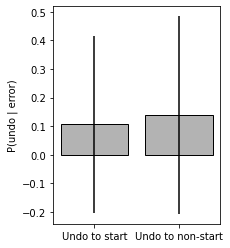

In [201]:
%matplotlib inline

fig, axs = plt.subplots(1, 1)
axs.bar([1,2],[err_st.mean(), err_nonst.mean()],color=[.7,.7,.7], edgecolor = 'k', yerr=[err_st.std(), err_nonst.std()])
axs.set_ylabel('P(undo | error)')
axs.set_xticks([1,2])
axs.set_xticklabels(labels = ['Undo to start', 'Undo to non-start'])#,fontsize=18
fig.set_figheight(4)
fig.set_figwidth(3)
plt.show()
# fig.savefig(out_dir + 'conditional_pundo_givenError.pdf', dpi=600, bbox_inches='tight')
